[**<span class="mark"><u>What are PFAS, the ‘forever chemicals’ showing up in drinking water? An environmental health scientist explains.</u></span>**](https://theconversation.com/what-are-pfas-the-forever-chemicals-showing-up-in-drinking-water-an-environmental-health-scientist-explains-185015)

<span class="mark">Kate Crawford is an Assistant Professor of Environmental Health at Middlebury College, Vermont</span>

<span class="mark">Published: June 21, 2022 7:50 am EDT</span>

<span class="mark">Updated: July 11, 2023 10:57 am EDT</span>

**<span class="mark"><u>Introduction to Sampling</u></span>**

- <span class="mark">A **sample** is a smaller group selected from a larger **population**.</span>

- <span class="mark">We use samples to learn about the larger population because examining everyone is often impossible or impractical.</span>

- <span class="mark">Examples of situations where samples are used include:</span>

  - <span class="mark">Polls to predict election outcomes.</span>

  - <span class="mark">Traffic studies on seat belt use.</span>

  - <span class="mark">Product testing for quality control.</span>

  - <span class="mark">Taste (examine) a small part of what you’re cooking to get an idea about the dish as a whole.</span>

- <span class="mark">Statistics are essential to make the connection from the sample to the whole population.</span>

**<span class="mark"><u>Key Ideas in Sampling</u></span>**

<span class="mark">**Idea 1: Examine a Part of the Whole**</span>

- <span class="mark">It is often not practical or possible to examine the entire population.</span>

- <span class="mark">A well-selected sample can represent the entire population.</span>

- <span class="mark">**Sample surveys** are designed to ask questions of a small group to learn about the entire population.</span>

- <span class="mark">**Bias** occurs when the sampling method over or under emphasizes certain characteristics of the population.</span>

  - <span class="mark">Biased samples lead to flawed conclusions.</span>

  - <span class="mark">It is very difficult or impossible to fix bias after a sample is drawn.</span>

- <span class="mark">The population is determined by the *Why* of the study, while the sample is the *Who*.</span>

> 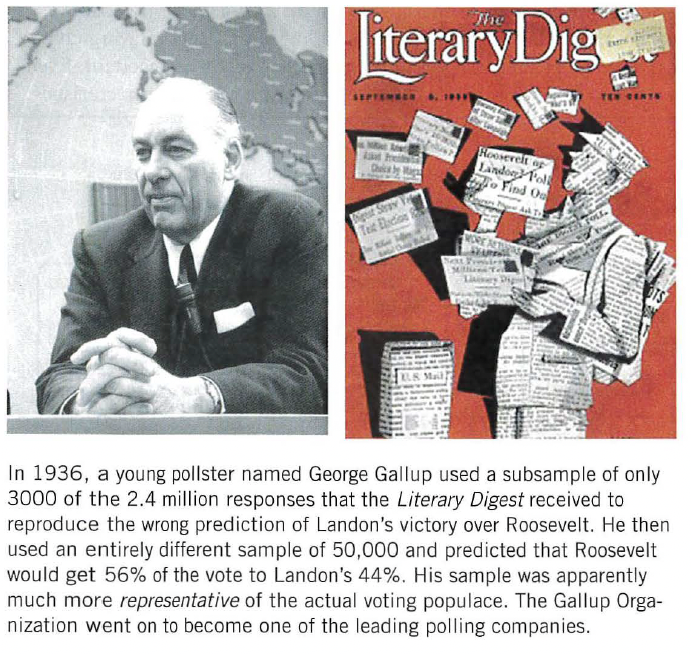

### 🧪 Interactive Experiment: The Danger of Bias

**Bias** is a systematic error. It's not just "bad luck" — it's like a load cell that is always 50 lbs off.

In this simulation, we know the **True Population Mean** compressive strength of concrete cylinders is **4000 psi**.
Try the two different sampling methods:

1.  **Simple Random Sample (SRS):** Every cylinder from the full production run has an equal chance of being selected.
    *   *Try changing the sample size.* Does the Sample Mean stay close to the True Mean?
2.  **Convenience Sample:** Imagine you only test cylinders from a high-performance batch (cured under ideal lab conditions).
    *   *What happens to the Sample Mean?*
    *   *Does increasing the sample size fix the error?* (Hint: NO!)


In [ ]:
# @title Click 'Play' to Run Code
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets
from IPython.display import display

# Generate Population Data (once)
np.random.seed(42)
population_size = 1000
# True Population: Average compressive strength 4000 psi, std dev 500 psi
true_mean = 4000
population = np.random.normal(true_mean, 500, population_size)

# Create a "Biased" sub-group (e.g., high-performance batch cylinders are stronger)
# Cylinders with higher strength are more likely to be in the "Convenience" location
bias_weight = (population - 2500) / 1500
bias_probs = np.exp(bias_weight) / np.sum(np.exp(bias_weight))

def run_sampling_sim(sample_method, sample_size):
    plt.figure(figsize=(10, 6))

    # 1. Plot Population Distribution (Grey background)
    plt.hist(population, bins=30, alpha=0.3, color='grey', label='Full Production Run (Ground Truth)', density=True)
    plt.axvline(true_mean, color='black', linestyle='--', linewidth=2, label=f'True Mean ({true_mean:.0f} psi)')

    # 2. Draw Sample
    if sample_method == 'Simple Random Sample (SRS)':
        # Every cylinder has equal chance
        sample_data = np.random.choice(population, size=sample_size, replace=False)
        color = 'blue'
        title_extra = "unbiased"
    else: # Convenience Sample (Biased)
        # Stronger cylinders are more likely to be selected
        sample_data = np.random.choice(population, size=sample_size, replace=False, p=bias_probs)
        color = 'red'
        title_extra = "BIASED towards high-strength specimens"

    # 3. Plot Sample Distribution
    sample_mean = np.mean(sample_data)
    plt.hist(sample_data, bins=15, alpha=0.7, color=color, label=f'Your Sample (n={sample_size})', density=True)
    plt.axvline(sample_mean, color=color, linestyle='-', linewidth=3, label=f'Sample Mean ({sample_mean:.0f} psi)')

    plt.title(f"Sampling Method: {sample_method}\nSample Average: {sample_mean:.0f} psi (True: {true_mean:.0f} psi)", fontsize=14)
    plt.xlabel("Compressive Strength (psi)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Educational Note
    if sample_method != 'Simple Random Sample (SRS)' and abs(sample_mean - true_mean) > 200:
        plt.text(2200, 0.0006, "Notice: Bias pushes the\nresult away from truth!",
                 color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))
        if sample_size > 200:
             plt.text(2200, 0.0003, "Even a LARGE biased sample\nis still WRONG!",
                 color='darkred', fontsize=12, fontweight='bold', bbox=dict(facecolor='white', alpha=0.8))

    plt.show()

# UI Elements
style = {'description_width': 'initial'}
method_dropdown = widgets.Dropdown(
    options=['Simple Random Sample (SRS)', 'Convenience Sample (High-Performance Batch)'],
    value='Simple Random Sample (SRS)',
    description='Sampling Method:',
    style=style,
    layout=widgets.Layout(width='450px')
)

size_slider = widgets.IntSlider(
    value=50,
    min=10,
    max=500,
    step=10,
    description='Sample Size (n):',
    style=style
)

ui = widgets.VBox([method_dropdown, size_slider])
out = widgets.interactive_output(run_sampling_sim, {'sample_method': method_dropdown, 'sample_size': size_slider})

display(widgets.HTML("<h3>Experiment: Random vs. Biased Sampling</h3>"))
display(widgets.HTML("<b>Goal:</b> Estimate the average compressive strength of concrete cylinders from a production run."))
display(ui, out)


**<span class="mark">Do you remember the Tacoma Narrows Bridge?</span>**

- <span class="mark">In 1940, the Tacoma Narrows Bridge in Washington State was one of the longest suspension bridges ever built. Engineers had conducted extensive wind tunnel testing before construction — they had a large "sample" of wind-load data.</span>

- <span class="mark">Their data predicted the bridge could easily handle sustained winds of 120 mph.</span>

- <span class="mark">On November 7, 1940, the bridge collapsed catastrophically in winds of only 42 mph — well within the bridge's supposed safe range.</span>

- <span class="mark">The engineers' sample wasn't representative of real-world conditions.</span>

- <span class="mark">Wind tunnel tests had only measured **steady-state** (laminar) wind loads. But in the real world, winds are turbulent and oscillating. The tests systematically excluded the kind of aerodynamic flutter that ultimately destroyed the bridge.</span>

- <span class="mark">This is the same lesson as with any biased sample: **no matter how much data you collect, if it's systematically missing a key part of the picture, your conclusions can be catastrophically wrong.**</span>


**<span class="mark">Idea 2: Randomize</span>**

- <span class="mark">Samples should be chosen **at random**.</span>

- <span class="mark">Randomization helps protect against known and unknown factors that could influence the sample.</span>

- <span class="mark">Randomizing helps make the sample look like the rest of the population.</span>

- <span class="mark">It is not practical to match a sample to the population for all characteristics, so randomization is used.</span>

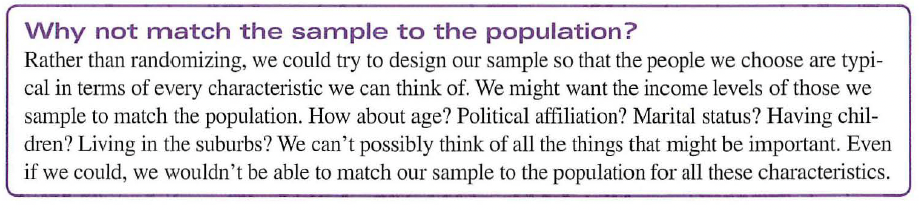

**<span class="mark">Idea 3: It's the Sample Size</span>**

<span class="mark">The **size of the sample**, not the size of the population, matters most.</span>

- <span class="mark">A sample of 100 can represent a single bridge or an entire highway system.</span>

- <span class="mark">The fraction of the population sampled does not matter.</span>

- <span class="mark">The necessary size of the sample depends on what is being estimated.</span>



### Interactive Experiment: The Power of Sample Size

One of the key ideas in sampling is that **size matters**.
*   A small sample (e.g., testing 5 concrete cylinders) can yield results very far from the truth just by random chance.
*   A large sample (e.g., testing 500 cylinders) tends to be much closer to the truth.

**Try it:**
Move the slider to increase the **Sample Size ($n$)**.
Notice how the blue line (your sample average) swings wildly at the beginning but "settles down" near the red line (the true population average) as $n$ gets larger.



In [ ]:
# @title Click 'Play' to Run Code

import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

def plot_sample_size_demo(n):
    # True Population: Mean=50, Std=15
    pop_mean = 50
    pop_std = 15
    
    # Generate one sample of size n
    sample = np.random.normal(pop_mean, pop_std, n)
    sample_mean = np.mean(sample)
    
    # Generate history of means for plot (to show "settling")
    # We'll simulate increasing sample sizes up to n
    ns = np.arange(1, n + 1)
    # For speed, just plot the cumulative mean of this one large sample sequence
    # This mimics "adding more people to the sample"
    cumulative_means = np.cumsum(sample) / ns
    
    plt.figure(figsize=(10, 5))
    plt.plot(ns, cumulative_means, label='Sample Mean', color='blue')
    plt.axhline(pop_mean, color='red', linestyle='--', label=f'True Mean ({pop_mean})')
    
    plt.xlim(1, 1000)
    plt.ylim(30, 70)
    plt.xlabel('Sample Size (n)')
    plt.ylabel('Average Value')
    plt.title(f'Effect of Sample Size: Current Mean = {sample_mean:.2f} (n={n})')
    plt.legend()
    plt.grid(alpha=0.3)
    
    plt.show()

display(widgets.interactive(plot_sample_size_demo, 
                            n=widgets.IntSlider(value=10, min=2, max=1000, step=10, description='Sample Size:')))


**<span class="mark"><u>Does a Census Make Sense?</u></span>**

<span class="mark">Wouldn't it be better to just include everyone and “sample” the entire population?</span>

- <span class="mark">Such a special sample is called a **census**.</span>

<span class="mark">There are problems with taking a census:</span>

- <span class="mark">It can be difficult to complete a census—there always seem to be some individuals who are hard (or expensive) to locate or hard to measure; or it may be impractical.</span>

  - <span class="mark">For example, destructive material testing (like crushing concrete cylinders to find their compressive strength) literally destroys the specimen — you can't test every single one or you'd have nothing left to build with.</span>

- <span class="mark">Populations rarely stand still. Even if you could take a census, the population changes while you work, so it's never possible to get a perfect measure.</span>



**<span class="mark"><u>Populations and Parameters</u></span>**

- <span class="mark">Models use mathematics to represent reality.</span>

  - <span class="mark">**Parameters** are the key numbers in those models.</span>

- <span class="mark">A parameter that is part of a model for a population is called a **population** **parameter**.</span>

- <span class="mark">We use data to estimate population parameters.</span>

  - <span class="mark">Any summary found from the data is a **statistic**.</span>

  - <span class="mark">The statistics that estimate population parameters are called **sample** **statistics**.</span>

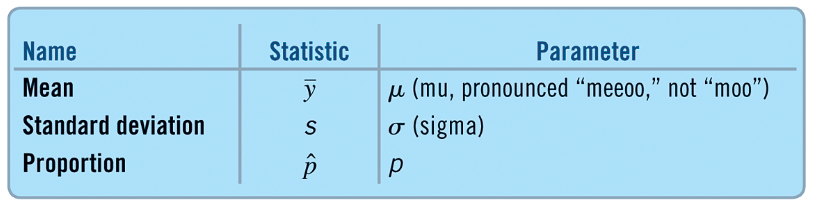

**<span class="mark">Example:</span>**

The Federal Highway Administration (FHWA) maintains the National Bridge Inventory, a database of every bridge in the United States. To assess structural conditions more efficiently, they conducted a detailed inspection of a "nationally representative sample" of 2032 bridges. Identify each of the following as a **parameter** or **statistic**:

1.  The proportion of all American bridges that are rated "structurally deficient."

2.  The proportion of these 2032 bridges that are rated "structurally deficient."

3.  The proportion of steel bridges in this sample that are rated "structurally deficient."

4.  The average annual maintenance cost for the bridges in this study.

5.  The average annual maintenance cost for all American bridges.


**<span class="mark"><u>Types of Samples</u></span>**

<span class="mark">We draw samples because we can’t work with the entire population.</span>

- <span class="mark">We need to be sure that the statistics we compute from the sample reflect the corresponding parameters accurately.</span>

- <span class="mark">A sample that does this is said to be **representative**.</span>

<span class="mark">Samples drawn at random generally differ from one another.</span>

- <span class="mark">Each draw of random numbers selects different people for our sample.</span>

- <span class="mark">These differences lead to different values for the variables we measure.</span>

- <span class="mark">We call these sample-to-sample differences **sampling variability**.</span>

**<span class="mark">Simple Random Sample (SRS):</span>**

- **<span class="mark">Every possible sample of the size you plan to draw has an equal chance to be selected.</span>**

- <span class="mark">Each individual has an equal chance of being selected.</span>

- <span class="mark">An SRS is the standard against which we measure other sampling methods.</span>

  - <span class="mark">To select an SRS, assign a number to each individual in the **sampling frame** (a list of individuals from which the sample is drawn).</span>

  - <span class="mark">Then, use a random number generator or table to select the sample.</span>

**<span class="mark">Stratified Random Sample:</span>**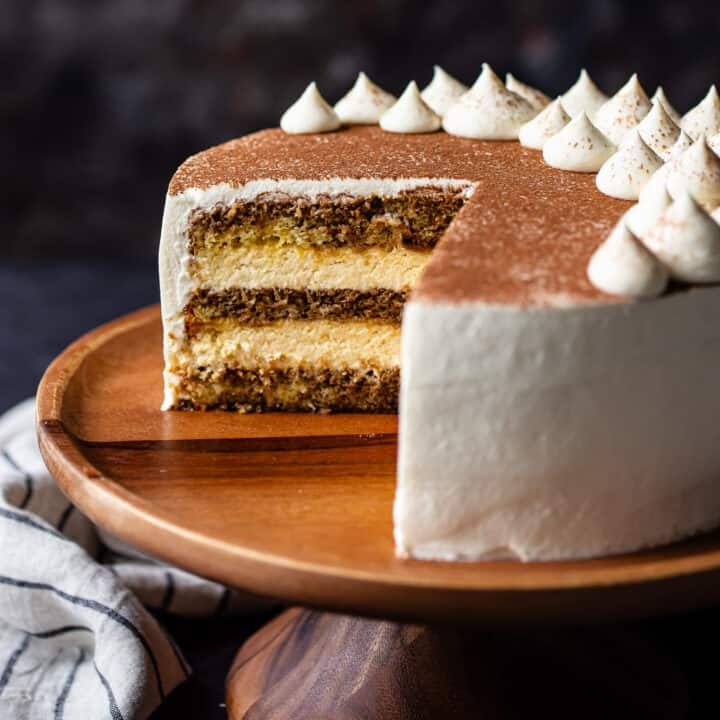

- <span class="mark">Samples from large populations are often more complicated than SRS.</span>

- <span class="mark">The population is divided into groups of similar individuals called **strata** (homogeneous).</span>

  - <span class="mark">An SRS is taken within each stratum, and then the results are combined.</span>

- <span class="mark">Stratifying helps reduce sampling variability.</span>

- <span class="mark">Stratify when different subgroups of the population may have different responses.</span>

**<span class="mark">Cluster Sample:</span>**

- <span class="mark">Splitting the population into representative **clusters** can make sampling more practical.</span>

  - <span class="mark">Then we could select one or a few clusters at random and perform a census within each of them.</span>

  - <span class="mark">If each cluster fairly represents the full population, cluster sampling will give us an unbiased sample.</span>

- <span class="mark">Cluster sampling is not the same as stratified sampling.</span>

  - <span class="mark">We stratify to ensure that our sample represents different groups in the population, and sample randomly within each stratum.</span>

    - <span class="mark">Strata are internally similar, but differ from one another.</span>

  - <span class="mark">Clusters are more or less alike, are internally varied, each resembling the overall population.</span>

    - <span class="mark">We select clusters to make sampling more practical or affordable.</span>

**<span class="mark">Map of Colorado</span>**

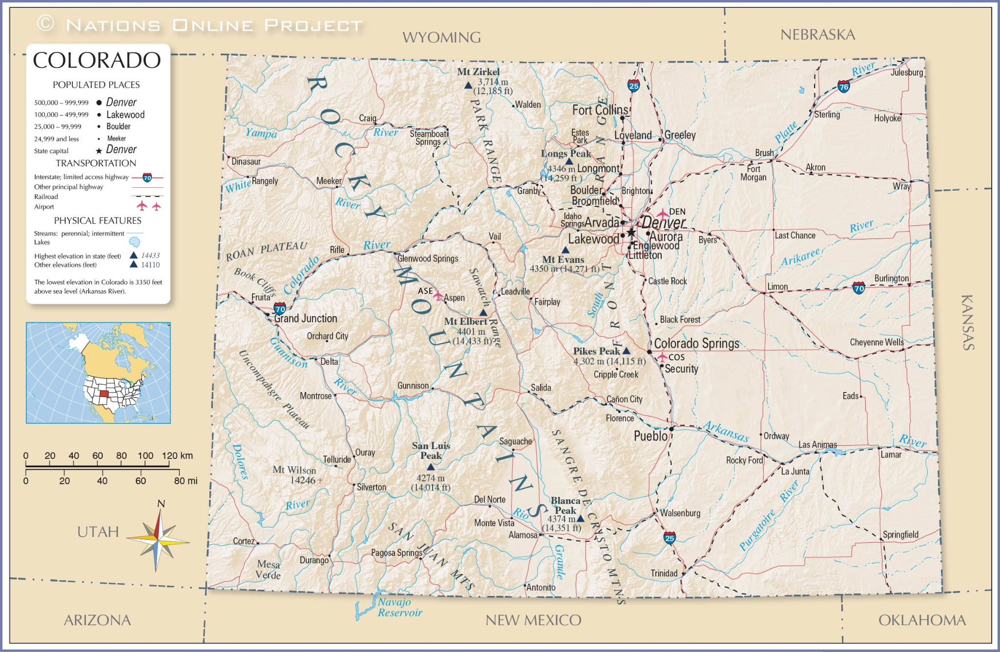

**<span class="mark">Northeast Philadelphia</span>**

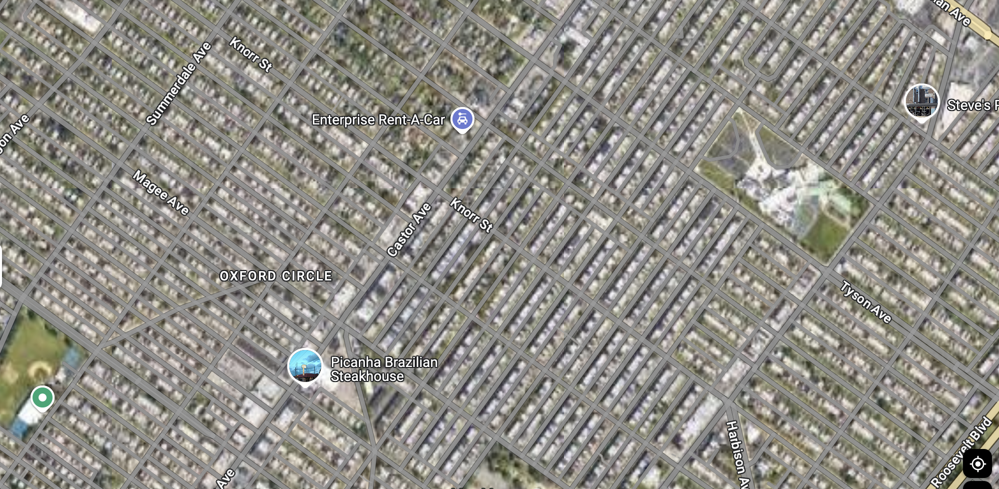

**<span class="mark">Multistage Sample:</span>**

- <span class="mark">Combines several sampling methods.</span>

  - <span class="mark">For example, you might stratify by the part of a book and randomly choose a chapter to represent each stratum, then choose pages as clusters, and finally select an SRS of sentences.</span>

- <span class="mark">Most surveys conducted by professional polling organizations use some combination of stratified and cluster sampling as well as simple random sampling.</span>

**<span class="mark">Systematic Sample:</span>**

- <span class="mark">Individuals are selected systematically.</span>

  - <span class="mark">For example, every 10th weld on a structural steel fabrication line.</span>

  - <span class="mark">To make it random, you must still start the systematic selection from a randomly selected individual.</span>

- <span class="mark">Can be less expensive than true random sampling.</span>



### Interactive Experiment: Visualizing Sampling Methods

It's easy to confuse the definitions of different sampling strategies. Use the tool below to **visualize** the difference.
*   **SRS:** Pure chaos (random).
*   **Stratified:** We force fairness (e.g., ensure we get some Red and some Blue points).
*   **Cluster:** We save money/time by grabbing a whole "clump" (e.g., surveying everyone in one randomly selected classroom).
*   **Systematic:** We follow a rule (e.g., every 5th person).


In [ ]:
# @title Click 'Play' to Run Code

import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches

def plot_sampling_method(method):
    # Population: 10x10 Grid
    # Setup Strata: Left half (Red), Right half (Blue)
    # Setup Clusters: 4 quadrants (Top-Left, Top-Right, Bot-Left, Bot-Right)
    
    n_points = 100
    cols = 10
    rows = 10
    
    x = np.tile(np.arange(cols), rows)
    y = np.repeat(np.arange(rows), cols)
    colors = ['red' if c < 5 else 'blue' for c in x] # Strata colors
    
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Base Plot: All points faded
    ax.scatter(x, y, c=colors, s=50, alpha=0.2)
    
    start_idx = 0 # For systematic
    
    selected_indices = []
    
    if method == 'Simple Random Sample (SRS)':
        # Pick 20 random points
        selected_indices = np.random.choice(range(n_points), 20, replace=False)
        title = "SRS: Every individual has equal chance."
        
    elif method == 'Stratified':
        # Pick 10 from Red (Left), 10 from Blue (Right)
        red_indices = [i for i, c in enumerate(x) if c < 5]
        blue_indices = [i for i, c in enumerate(x) if c >= 5]
        sel_red = np.random.choice(red_indices, 10, replace=False)
        sel_blue = np.random.choice(blue_indices, 10, replace=False)
        selected_indices = np.concatenate([sel_red, sel_blue])
        title = "Stratified: Slice population into groups (Strata), sample from EACH group."
        
        # Draw Divider
        ax.axvline(4.5, color='black', linestyle='--')
        ax.text(2, -1, "Stratum 1", ha='center')
        ax.text(7, -1, "Stratum 2", ha='center')

    elif method == 'Cluster':
        # Clusters: 0:TL, 1:TR, 2:BL, 3:BR. Pick 1 random cluster.
        # TL: x<5, y>=5. TR: x>=5, y>=5. BL: x<5, y<5. BR: x>=5, y<5
        clusters = {0: [], 1: [], 2: [], 3: []}
        for i in range(n_points):
            if x[i]<5 and y[i]>=5: clusters[0].append(i)
            elif x[i]>=5 and y[i]>=5: clusters[1].append(i)
            elif x[i]<5 and y[i]<5: clusters[2].append(i)
            elif x[i]>=5 and y[i]<5: clusters[3].append(i)
            
        chosen_cluster = np.random.choice([0, 1, 2, 3])
        selected_indices = clusters[chosen_cluster]
        title = "Cluster: Split into groups, pick the WHOLE group."
        
        # Draw Cluster boxes
        rects = [
            patches.Rectangle((-0.5, 4.5), 5, 5, fill=False, edgecolor='green', lw=2), # TL
            patches.Rectangle((4.5, 4.5), 5, 5, fill=False, edgecolor='green', lw=2),  # TR
            patches.Rectangle((-0.5, -0.5), 5, 5, fill=False, edgecolor='green', lw=2),# BL
            patches.Rectangle((4.5, -0.5), 5, 5, fill=False, edgecolor='green', lw=2)  # BR
        ]
        # Highlight chosen
        rects[chosen_cluster].set_edgecolor('black')
        rects[chosen_cluster].set_linewidth(4)
        for r in rects: ax.add_patch(r)

    elif method == 'Systematic':
        # Pick every 5th person
        start = np.random.randint(0, 5)
        selected_indices = np.arange(start, n_points, 5)
        title = f"Systematic: Start at {start}, pick every 5th person."
        
        # Draw path
        # Connect dots to show order? Maybe too messy.
        
    # Plot Selected (Dark Mode)
    if len(selected_indices) > 0:
        sel_x = x[selected_indices]
        sel_y = y[selected_indices]
        sel_c = np.array(colors)[selected_indices]
        ax.scatter(sel_x, sel_y, c=sel_c, s=150, edgecolor='black', zorder=10)
    
    ax.set_title(title, fontsize=12)
    ax.axis('off')
    plt.show()

# Dropdown
style = {'description_width': 'initial'}
method_dropdown = widgets.Dropdown(
    options=['Simple Random Sample (SRS)', 'Stratified', 'Cluster', 'Systematic'],
    value='Simple Random Sample (SRS)',
    description='Method:',
    style=style,
    layout={'width': '400px'}
)

display(widgets.interactive(plot_sampling_method, method=method_dropdown))


**<span class="mark"><u>Sampling Methods - Videos</u></span>**

| [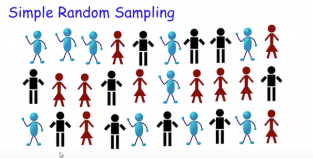](https://youtu.be/yx5KZi5QArQ?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1) | [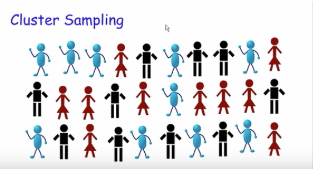](https://youtu.be/QOxXy-I6ogs?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1) |
|----|----|
| [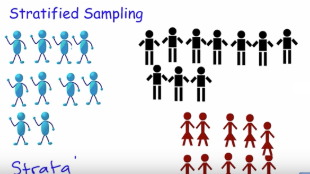](https://youtu.be/sYRUYJYOpG0?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1) | [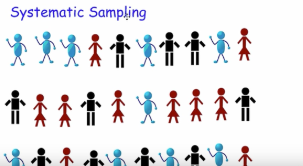](https://youtu.be/QFoisfSZs8I?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1) |

**<span class="mark"><u>Example of Multistage Sampling in National Bridge Inspection</u></span>**


**<span class="mark">Stage 1: Stratification by Climate Zone (Stratified Sampling)</span>**

- <span class="mark">The country is divided into AASHTO climate zones (e.g., Wet-Freeze, Wet-No Freeze, Dry-Freeze, Dry-No Freeze).</span>

- <span class="mark">This ensures that bridges exposed to different environmental stresses (freeze-thaw cycles, coastal salt spray, arid conditions) are represented proportionally.</span>


**<span class="mark">Stage 2: Selection of State DOTs (Cluster Sampling)</span>**

- <span class="mark">Within each climate zone, a random selection of state Departments of Transportation (DOTs) is chosen.</span>

- <span class="mark">This reduces the need to inspect bridges in every state, making the program more practical and cost-effective.</span>


**<span class="mark">Stage 3: Selection of Bridge Types (Cluster or Systematic Sampling)</span>**

- <span class="mark">Within each selected state, bridges are grouped by structural type (steel girder, prestressed concrete, timber, truss).</span>

- <span class="mark">A systematic approach (e.g., every 5th bridge on the state's inventory list) may be used to select candidates from each type.</span>


**<span class="mark">Stage 4: Random Selection of Individual Bridges (Simple Random Sampling)</span>**

- <span class="mark">Within the selected bridge types, individual bridges are randomly chosen for detailed load rating and inspection.</span>

- <span class="mark">Inspectors may use techniques like random number generators applied to the bridge ID list to avoid selection bias.</span>


**<span class="mark">Why Use Multistage Sampling?</span>**

<span class="mark">✅ Cost Efficiency: Instead of inspecting every bridge in the country, breaking the population into stages reduces the number of field crews needed.</span>

<span class="mark">✅ Improved Representation: It ensures different climate zones, structural types (steel/concrete/timber), and settings (urban/rural) are included.</span>

<span class="mark">✅ Practicality: It would be impossible to perform detailed load tests on all 600,000+ U.S. bridges, but multistage sampling allows for a manageable and logistically feasible way to obtain a representative assessment of the nation's infrastructure.</span>

**<span class="mark"><u>"[Practice? We talkin' 'bout practice?](https://youtu.be/eGDBR2L5kzI)"</u></span>**

<span class="mark">Now is a good time to try a little practice. Make a copy of the document, [<u>Sample Surveys Practice</u>](https://docs.google.com/document/d/1SSrgcw_cI5Ggoweb1b0kBKy4TrStGqmTsP2d3N_Q8N4/edit?usp=sharing), and save it to your Drive. We will complete the first problem together.</span>


**<span class="mark"><u>Lots Can Go Wrong: How to Sample Badly</u></span>**

**<span class="mark">Sample Badly with Volunteers:</span>**

- <span class="mark">In a **voluntary response sample**, a large group of individuals is invited to respond, and all who do respond are counted.</span>

  - <span class="mark">Voluntary response samples are almost always biased, and so conclusions drawn from them are almost always wrong.</span>

- <span class="mark">Voluntary response samples are often biased toward those with strong opinions or those who are strongly motivated.</span>

- <span class="mark">Since the sample is not representative, the resulting **voluntary response bias** invalidates the survey.</span>

**<span class="mark">Sample Badly, but Conveniently:</span>**

- <span class="mark">In **convenience sampling**, we simply include the individuals who are convenient.</span>

  - <span class="mark">Unfortunately, this group may not be representative of the population.</span>

- <span class="mark">Convenience sampling is not only a problem for students or other beginning samplers.</span>

  - <span class="mark">In fact, it is a widespread problem in the business world—the easiest people for a company to sample are its own customers.</span>

**<span class="mark">Undercoverage:</span>**

- <span class="mark">Many of these bad survey designs suffer from **undercoverage**, in which some portion of the population is not sampled at all or has a smaller representation in the sample than it has in the population. Undercoverage is a type of selection bias.</span>

**<span class="mark"><u>What Else Can Go Wrong?</u></span>**

**<span class="mark">Watch out for nonrespondents.</span>**

- <span class="mark">A common and serious potential source of bias for most surveys is **nonresponse bias**.</span>

- <span class="mark">No survey succeeds in getting responses from everyone.</span>

  - <span class="mark">The problem is that those who don’t respond may differ from those who do.</span>

  - <span class="mark">And they may differ on just the variables we care about.</span>

- <span class="mark">Don’t bore respondents with surveys that go on and on and on and on…</span>

  - <span class="mark">Surveys that are too long are more likely to be refused, reducing the response rate and biasing all the results.</span>

**<span class="mark">Work hard to avoid influencing responses.</span>**

- <span class="mark">**Response bias** refers to anything in the survey design that influences the responses.</span>

  - <span class="mark">For example, the wording of a question can influence the responses:</span>

| 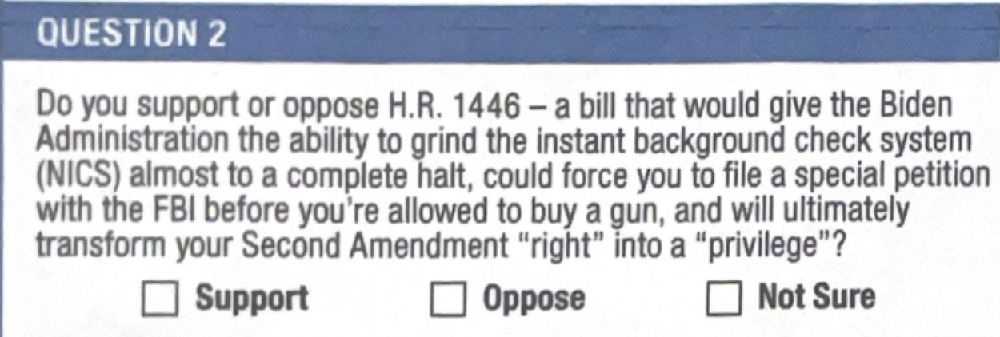 | 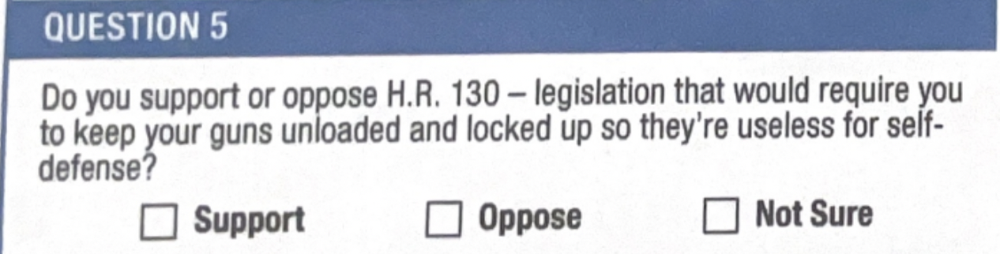 |
|----|----|

**<span class="mark"><u>What Have We Learned?</u></span>**

- <span class="mark">A representative sample can offer us important insights about populations.</span>

  - <span class="mark">It’s the size of the sample, not its fraction of the larger population, that determines the precision of the statistics it yields.</span>

- <span class="mark">There are several ways to draw samples, all based on the power of randomness to make them representative of the population of interest:</span>

  - <span class="mark">Simple Random Sample, Stratified Sample, Cluster Sample, Systematic Sample, Multistage Sample</span>

- <span class="mark">Bias can destroy our ability to gain insights from our sample:</span>

  - <span class="mark">Nonresponse bias can arise when sampled individuals will not or cannot respond.</span>

  - <span class="mark">Response bias arises when respondents’ answers might be affected by external influences, such as question wording or interviewer behavior.</span>

- <span class="mark">Bias can also arise from poor sampling methods:</span>

  - <span class="mark">Voluntary response samples are almost always biased and should be avoided and distrusted.</span>

  - <span class="mark">Convenience samples are likely to be flawed for similar reasons.</span>

  - <span class="mark">Even with a reasonable design, sample frames may not be representative.</span>

    - <span class="mark">Undercoverage occurs when individuals from a subgroup of the population are selected less often than they should be.</span>

- <span class="mark">Finally, we must look for biases in any survey we find and be sure to report our methods whenever we perform a survey so that others can evaluate the fairness and accuracy of our results.</span>

**<span class="mark"><u>Bias Videos</u></span>**

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<thead>
<tr>
<th style="text-align: left;"><p><mark>Student Created Video</mark></p>
<p><a href="https://youtu.be/mZimNTTRdH4?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1">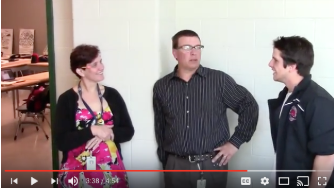</a></p></th>
<th style="text-align: left;"><p><mark>“Yes, Prime Minister”</mark></p>
<p><a href="https://youtu.be/G0ZZJXw4MTA?list=PL60HDYq8UVQIctEiwb01ctEv_geacCeb1">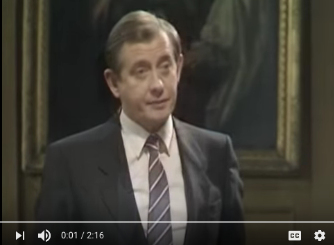</a></p></th>
</tr>
</thead>
<tbody>
</tbody>
</table>

**<span class="mark"><u>Key Vocabulary</u></span>**

<table>
<colgroup>
<col style="width: 29%" />
<col style="width: 37%" />
<col style="width: 33%" />
</colgroup>
<thead>
<tr>
<th><ul>
<li><p>Population</p></li>
<li><p>Sample</p></li>
<li><p>Sample survey</p></li>
<li><p>Biased</p></li>
<li><p>Randomization</p></li>
<li><p>Census</p></li>
<li><p>Parameter</p></li>
<li><p>Statistic</p></li>
</ul></th>
<th><ul>
<li><p>Simple Random Sample (SRS)</p></li>
</ul>
<ul>
<li><p>Sampling frame</p></li>
<li><p>Sampling variability</p></li>
<li><p>Homogeneous groups</p></li>
<li><p>Heterogeneous groups</p></li>
<li><p>Strata</p></li>
<li><p>Stratified random sampling</p></li>
<li><p>Cluster sampling</p></li>
</ul></th>
<th><ul>
<li><p>Multistage sampling</p></li>
</ul>
<ul>
<li><p>Systematic sampling</p></li>
<li><p>Voluntary response sample</p></li>
<li><p>Voluntary response bias</p></li>
<li><p>Convenience sampling</p></li>
<li><p>Undercoverage</p></li>
<li><p>Nonresponse bias</p></li>
<li><p>Response bias</p></li>
</ul></th>
</tr>
</thead>
<tbody>
</tbody>
</table>

[**<span class="mark"><u>Additional Examples of Sampling Bias</u></span>**](https://docs.google.com/document/d/1XG8hM6juooiH9NSSTNgZxdh8bLPWn5LRDrZVtpFUpTw/edit?usp=sharing)

<span class="mark">This document reviews each of the four types of bias we covered. It reviews some of the different ways each bias may appear when sampling.</span>